In [1]:
import pandas as pd
from tqdm import tqdm
from pathlib import Path
import pickle
import os
import numpy as np
from matplotlib import pyplot as plt
import torch
from typing import List, Tuple, Dict

In [2]:
DATA_CACHE = Path('../data/cache/')
DATA_RAW = Path('../data/raw/')

EEG_PATH = DATA_RAW / 'train_eegs/'
SPEC_PATH = DATA_RAW / 'train_spectrograms/'
METADATA_PATH = DATA_RAW / 'train.csv'
# EEG_PATH = DATA_RAW / 'test_eegs/'
# SPEC_PATH = DATA_RAW / 'test_spectrograms/'
# METADATA_PATH = DATA_RAW / 'test.csv'

EEG_SAMPLE_RATE = 200           # Hz
SPEC_SAMPLE_RATE = 0.5          # Hz
EEG_SNIPPET_LEN = 50            # seconds
SPECTROGRAM_SNIPPET_LEN = 600   # seconds

In [3]:
def eeg_from_parquet(parquet_path: str, display: bool = False) -> np.ndarray:
    """
    This function reads a parquet file and extracts the middle 50 seconds of readings. Then it fills NaN values
    with the mean value (ignoring NaNs).
    :param parquet_path: path to parquet file.
    :param display: whether to display EEG plots or not.
    :return data: np.array of shape  (time_steps, eeg_features) -> (10_000, 8)
    """
    # === Extract middle 50 seconds ===
    eeg = pd.read_parquet(parquet_path)
    rows = len(eeg)
    offset = (rows - 10_000) // 2 # 50 * 200 = 10_000
    eeg = eeg.iloc[offset:offset+10_000] # middle 50 seconds, has the same amount of readings to left and right
    
    # impute nan with zero
    eeg = eeg.fillna(0)    
    return eeg

In [4]:
# load metadata
metadata = pd.read_csv(METADATA_PATH)
vote_cols = [col for col in metadata.columns if 'vote' in col]
metadata['n_evaluators'] = metadata[vote_cols].sum(axis=1)

# select only 10+ votes
metadata = metadata[metadata['n_evaluators'] >= 10]
print(len(metadata))

# drop all dubplicate eeg_id rows
metadata = metadata.drop_duplicates(subset=['patient_id'])
print(len(metadata))
metadata.head()

39946
1063


,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,n_evaluators
9,2277392603,0,0.0,924234,0,0.0,1978807404,30539,GPD,0,0,5,0,1,5,11
11,722738444,0,0.0,999431,0,0.0,557980729,56885,LRDA,0,1,0,14,0,1,16
35,1202099836,0,0.0,1353070,0,0.0,3051612434,34554,Other,0,0,5,0,0,9,14
55,2578018731,1,20.0,2207717,1,20.0,1928228287,34153,GRDA,0,0,2,0,9,2,13
69,374504640,0,0.0,3452193,0,0.0,474823595,29847,GRDA,0,0,2,0,8,2,12


In [5]:
# load eeg data
eegs = {}
for eeg_id in tqdm(metadata['eeg_id']):
    eeg_path = EEG_PATH / f'{eeg_id}.parquet'
    eegs[eeg_id] = eeg_from_parquet(eeg_path)

100%|██████████| 1063/1063 [00:03<00:00, 279.70it/s]


In [6]:
from src.typing.typing import XData
import hydra
from omegaconf import OmegaConf

# load the hydra yaml file dash.yaml
cfg = OmegaConf.load("../dashboard/dash.yaml")

# instantiate the pipeline
pipeline = hydra.utils.instantiate(cfg.pipeline)

# create an XData object with a single EEG
X = XData(meta=pd.DataFrame(), eeg=eegs, kaggle_spec=None, eeg_spec=None, shared=None)

# process the EEG data
X = pipeline.transform(X)
if X.eeg is None:
    raise ValueError("No EEG data found.")
eegs_processed = X.eeg




                                                                                        Transformation Pipeline                                                                                         





Quantizing EEG data: 100%|██████████| 1063/1063 [00:03<00:00, 352.11it/s]


In [7]:
def generate_features(eeg, plot=False):
    # Takes an EEG signal dataframe and returns a series of features
    
    result = pd.Series()
    
    # Mean of each channel
    result['mean'] = eeg.mean().mean()
    
    # Standard deviation of each channel
    result['std'] = eeg.std().mean()
    
    
    custom_feature = eeg.diff().abs().mean(axis=1)
   
    
    def freqs(col):
        fft = np.abs(np.fft.fft(eeg[col]))[:len(custom_feature)//2]
        freq = np.fft.fftfreq(len(eeg), 1/EEG_SAMPLE_RATE)[:len(custom_feature)//2]
        fft = fft[freq < 5]
        freq = freq[freq < 5]
        return freq, fft
    
    fft_arr = []
    for col in eeg.columns:
        freq, fft = freqs(col)
        fft_arr.append(fft)
    avg_fft = np.mean(fft_arr, axis=0)
    
    if plot:
        plt.figure(figsize=(15, 5))
        plt.plot(custom_feature)
        plt.show()
        
        # Plot fourier transform between 0 and 20 hz
        plt.figure(figsize=(15, 5))
        plt.plot(freq, avg_fft)
        plt.show()
        
        for col in eeg.columns:
            freq, fft = freqs(col)
            plt.plot(freq, fft, label=col)
            plt.title(col)
            plt.show()
    
    custom_feature = custom_feature.rolling(100).median().ffill().bfill()
    
    similarities = []
    dots = []
    for left,right in [
        ('LT1','RT1'),
        ('LT2','RT2'),
        ('LP1','RP1'),
        ('LP2','RP2')]:
        similarities.append(np.corrcoef(eeg[left], eeg[right])[0,1])
        dots.append(np.dot(eeg[left], eeg[right]))

    amplitude_left = eeg[[col for col in eeg.columns if 'L' in col]].abs().mean().mean()
    amplitude_right = eeg[[col for col in eeg.columns if 'R' in col]].abs().mean().mean()
    
    normalized_amplitude_difference_index = abs(amplitude_left - amplitude_right) / (amplitude_left + amplitude_right)
    
    result['low_activity'] = (custom_feature < 0.02).mean()
    result['high_activity'] = (custom_feature > 0.1).mean()
    result['freq_peak'] = np.argmax(avg_fft)
    result['freq_peak_val'] = np.max(avg_fft)
    result['similarity'] = np.mean(similarities)
    result['dots'] = np.mean(dots)
    result['2-5hz'] = np.sum(avg_fft[(freq > 2) & (freq < 5)])
    result['2-5hz_over_peak'] = result['2-5hz'] / result['freq_peak_val']
    result['peak_ratio'] = np.max(avg_fft) / np.mean(avg_fft)
    result['NDAI'] = normalized_amplitude_difference_index
    
    return result   
    

In [8]:
# copy the metadata, to add features
df = metadata.copy()[['eeg_id']+[col for col in metadata.columns if 'vote' in col]]

# normalize the votes to sum to 1
votes = df[[col for col in df.columns if 'vote' in col]]
votes = votes.div(votes.sum(axis=1), axis=0)
df[[col for col in df.columns if 'vote' in col]] = votes

df = pd.concat([df, df['eeg_id'].apply(lambda eeg_id: generate_features(eegs_processed[eeg_id]))], axis=1)
df.drop('eeg_id', axis=1, inplace=True)
df.head()

,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,mean,std,low_activity,high_activity,freq_peak,freq_peak_val,similarity,dots,2-5hz,2-5hz_over_peak,peak_ratio,NDAI
9,0.0,0.0000,0.454545,0.000,0.090909,0.454545,-0.001014,0.425490,0.2471,0.0000,33.0,423.840210,0.610337,1116.010498,21199.873047,50.018551,2.794083,0.023541
11,0.0,0.0625,0.000000,0.875,0.000000,0.062500,0.017388,0.965765,0.0000,0.0000,61.0,1447.754761,0.294180,3029.089844,28453.619141,19.653618,4.880609,0.127321
35,0.0,0.0000,0.357143,0.000,0.000000,0.642857,0.006163,0.617922,0.0005,0.0269,39.0,988.710571,0.624796,2271.160645,14934.467773,15.104995,5.423691,0.182897
55,0.0,0.0000,0.153846,0.000,0.692308,0.153846,0.005289,0.842290,0.0000,0.0000,38.0,1029.647095,0.659654,4416.879883,31956.925781,31.036776,3.612530,0.002694
69,0.0,0.0000,0.166667,0.000,0.666667,0.166667,0.014151,0.814366,0.0000,0.0274,125.0,920.157227,0.756663,4901.769043,40980.484375,44.536392,3.217308,0.011848


In [20]:
df.describe()

,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,mean,std,low_activity,high_activity,freq_peak,freq_peak_val,similarity,dots,2-5hz,2-5hz_over_peak,peak_ratio,NDAI
count,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000,1063.000000
mean,0.057542,0.088723,0.089340,0.070619,0.111399,0.582378,0.002073,0.792214,0.035887,0.273612,48.902164,981.251648,0.495719,3655.843018,24410.890625,27.093254,4.345601,0.089461
std,0.155836,0.203704,0.207893,0.151114,0.190295,0.338282,0.011612,0.362654,0.137715,0.376096,33.273930,570.316467,0.227223,4903.570312,13592.242188,11.579000,2.209482,0.113602
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.077473,0.074946,0.000000,0.000000,0.000000,53.544289,-0.718881,-30325.906250,1768.039185,2.818606,2.066106,0.000074
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.272727,-0.002463,0.545382,0.000000,0.000000,27.000000,651.979828,0.386753,1157.366760,14799.728027,18.856362,3.303778,0.018949
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.625000,0.000761,0.728517,0.000000,0.031300,39.000000,866.078918,0.530399,2411.529785,21518.656250,25.314184,3.924345,0.047473
75%,0.000000,0.066667,0.062500,0.066667,0.142857,0.923077,0.005529,0.942399,0.000000,0.529350,59.000000,1154.545410,0.654687,4657.763184,30663.453125,34.382532,4.764169,0.111803
max,0.937500,1.000000,1.000000,0.937500,1.000000,1.000000,0.121115,2.662676,1.000000,1.000000,238.000000,8461.431641,0.967458,57411.640625,113419.226562,70.870338,34.460129,0.748729


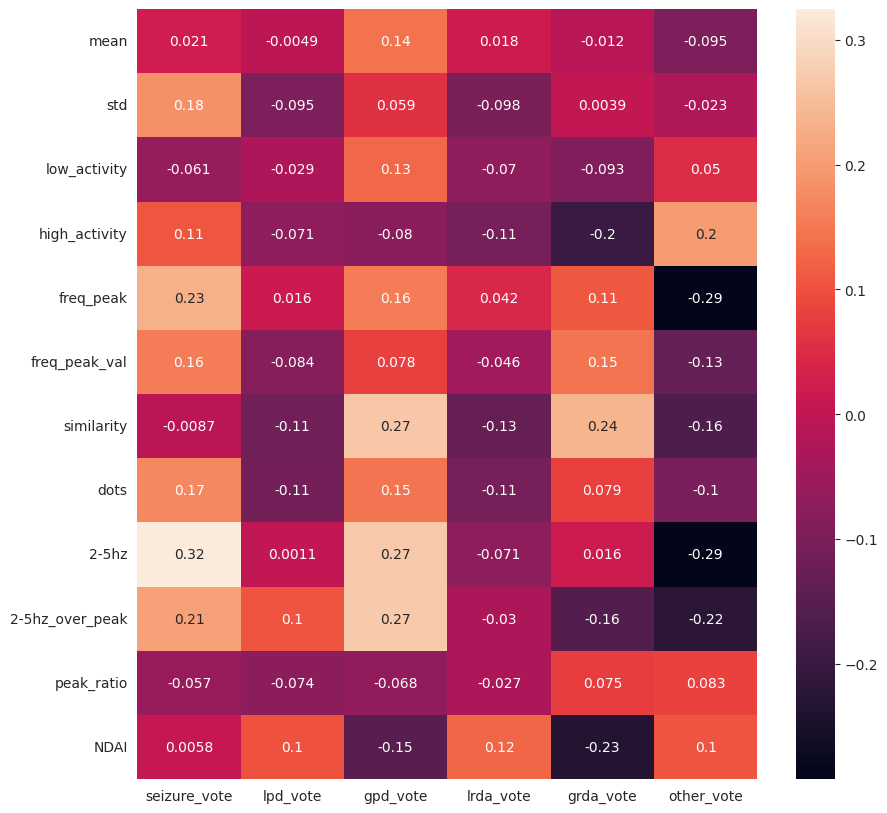

In [9]:
# plot the correlation matrix
import seaborn as sns

plt.figure(figsize=(10, 10))
corr = df.corr()

# select only the votes columns, drop the votes rows
corr = corr[votes.columns].drop(votes.columns)

sns.heatmap(corr, annot=True)
plt.show()

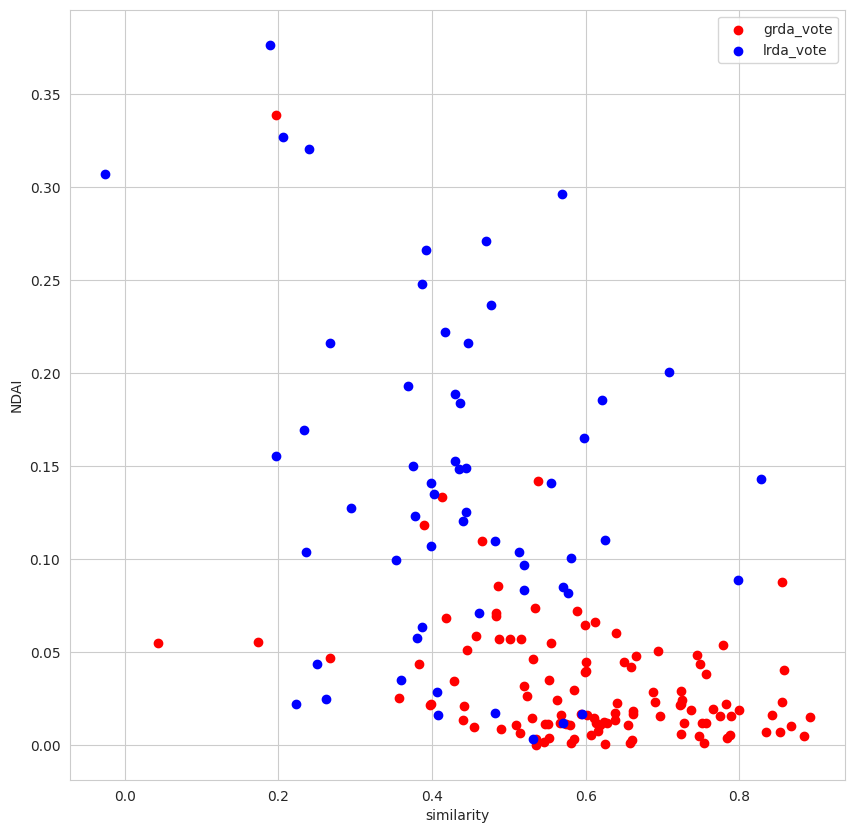

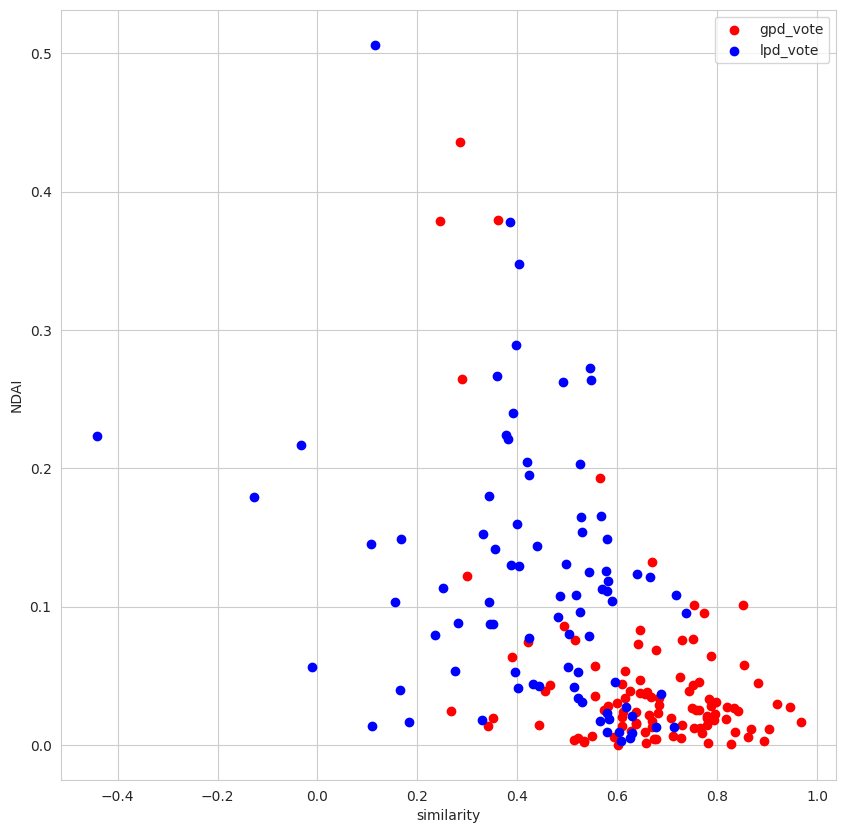

In [16]:
def plot_scatter(class1, class2, feature1, feature2):
    selection = df[(df[class1] > 0.4) | (df[class2] > 0.4)]
    is_class1 = selection[class1] < selection[class2]
    is_class2 = selection[class1] > selection[class2]
    
    plt.figure(figsize=(10, 10))
    plt.scatter(selection[is_class1][feature1], selection[is_class1][feature2], c='r', label=class2)
    plt.scatter(selection[is_class2][feature1], selection[is_class2][feature2], c='b', label=class1)
    plt.xlabel(feature1)
    plt.ylabel(feature2)
    plt.legend()
    plt.show()
    
plot_scatter('lrda_vote', 'grda_vote', 'similarity', 'NDAI')
plot_scatter('lpd_vote', 'gpd_vote', 'similarity', 'NDAI')
plot_scatter('lpd_vote', 'lrda', 'freq_peak_val', 'NDAI')

In [11]:
#random forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

X = df.drop([col for col in df.columns if 'vote' in col], axis=1)
y = df[[col for col in df.columns if 'vote' in col]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestRegressor()
model.fit(X_train, y_train)

RandomForestRegressor()

In [12]:
y_pred = model.predict(X_test)
y_pred = y_pred / y_pred.sum(axis=1)[:, None]

# use torch kldiv to calculate the loss
from torch.nn.functional import kl_div
import torch

log_pred = torch.log(torch.clamp(torch.tensor(y_pred), min=10**-3, max=1 - 10**-3))
loss = kl_div(log_pred, torch.tensor(y_test.values), reduction='batchmean')
print(f"KLDiv Loss: {loss.item()} across {len(y_test)} samples.")

# for i in range(10):
#     print(f"True: {[f'{x:.2f}' for x in y_test.iloc[i].values]}")
#     print(f"Pred: {[f'{x:.2f}' for x in y_pred[i]]}")
#     print()

KLDiv Loss: 0.5947333673005192 across 213 samples.


In [13]:
for cls in y.columns:
    print(f"{cls}: {np.corrcoef(y_test[cls], y_pred[:,y.columns.get_loc(cls)])[0,1]:.2f}")

seizure_vote: 0.32
lpd_vote: 0.39
gpd_vote: 0.58
lrda_vote: 0.31
grda_vote: 0.52
other_vote: 0.56


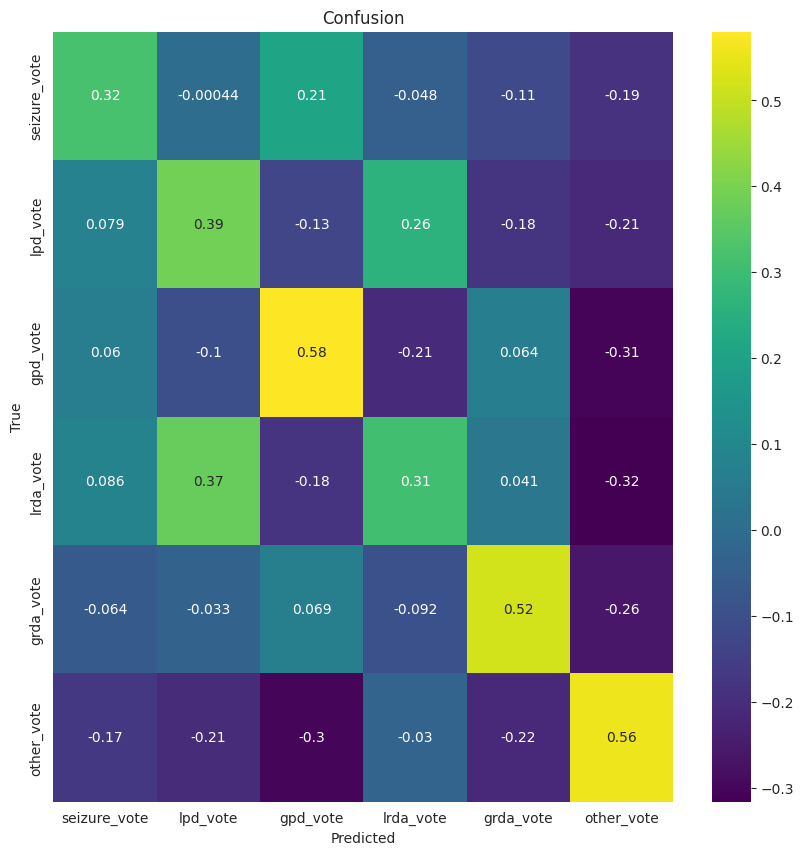

In [18]:
# compute the correlation matrix, from all predictions, to all targets
corrs = np.zeros((len(y.columns), len(y.columns)))
for i, cls1 in enumerate(y.columns):
    for j, cls2 in enumerate(y.columns):
        corrs[i, j] = np.corrcoef(y_pred[:,i], y_test[cls2])[0,1] #/ np.mean(y_test[cls1])

plt.figure(figsize=(10, 10))
sns.heatmap(corrs, annot=True, xticklabels=y.columns, yticklabels=y.columns, cmap='viridis')
plt.title('Confusion')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

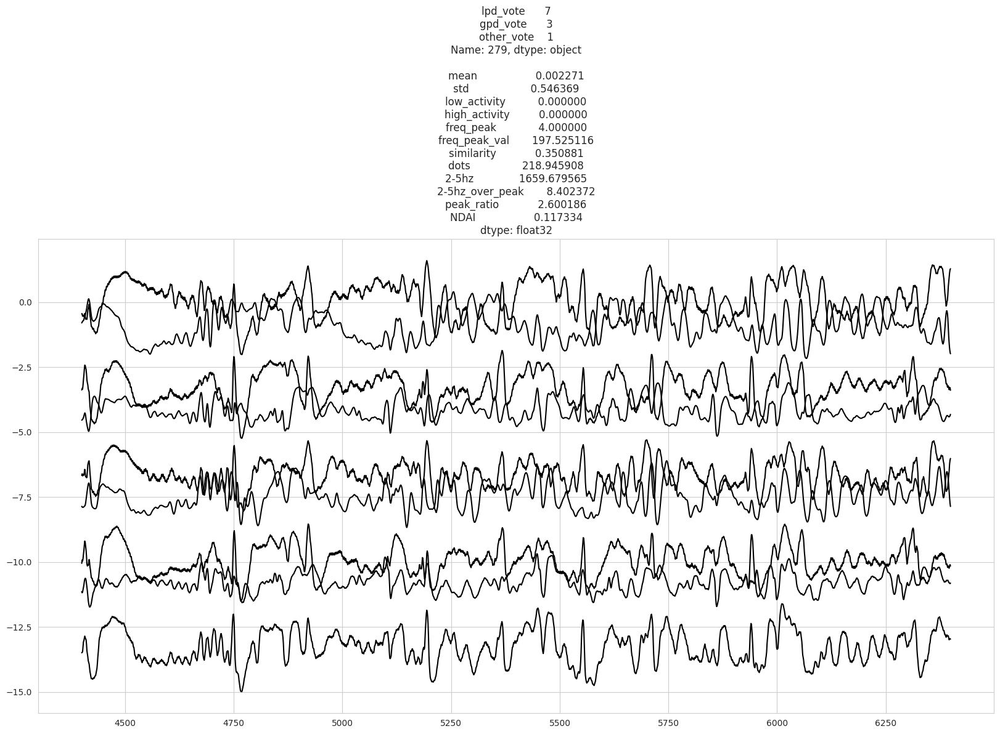

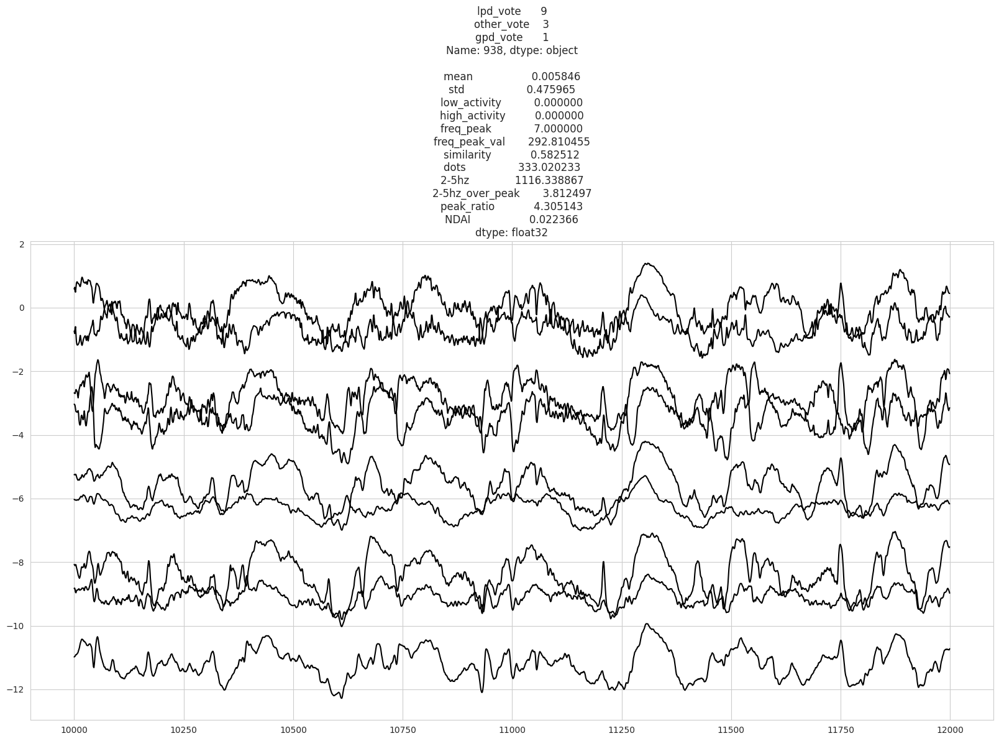

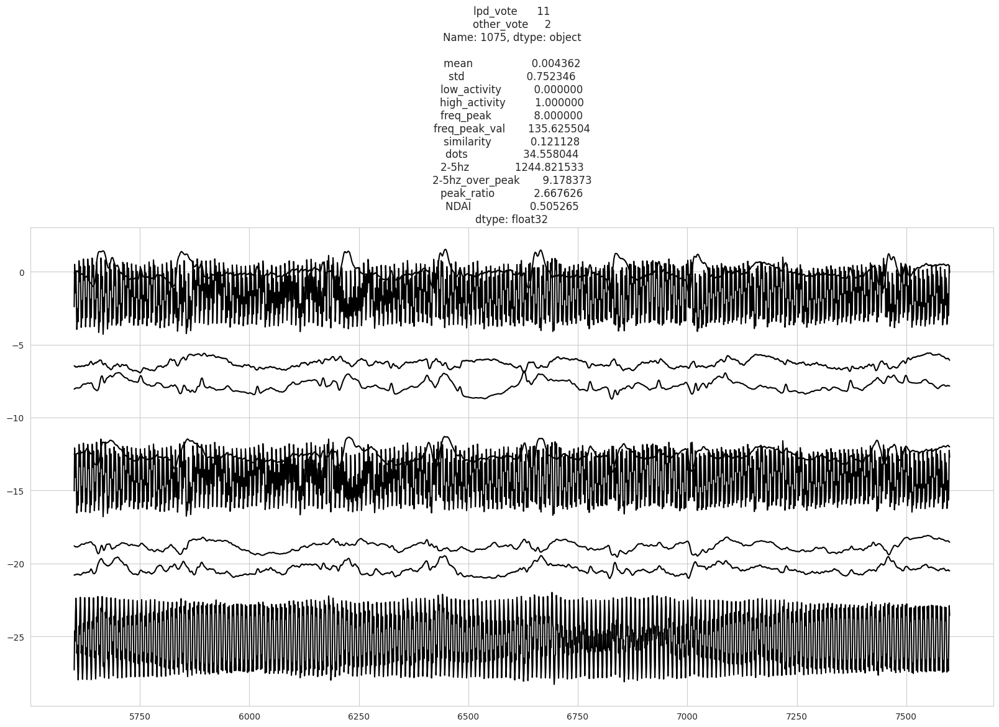

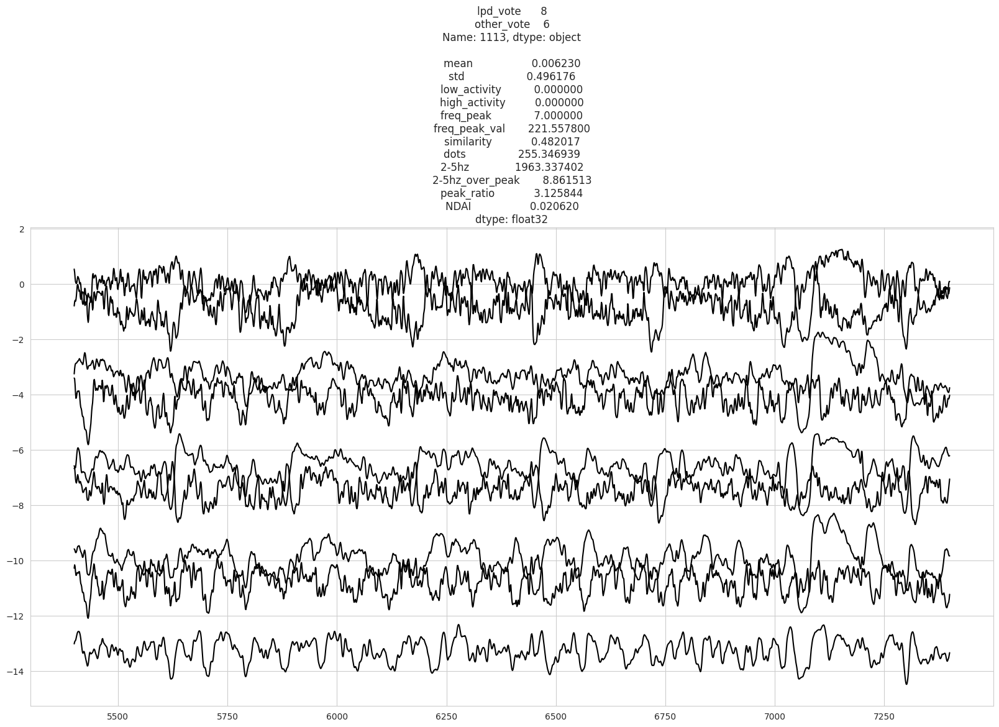

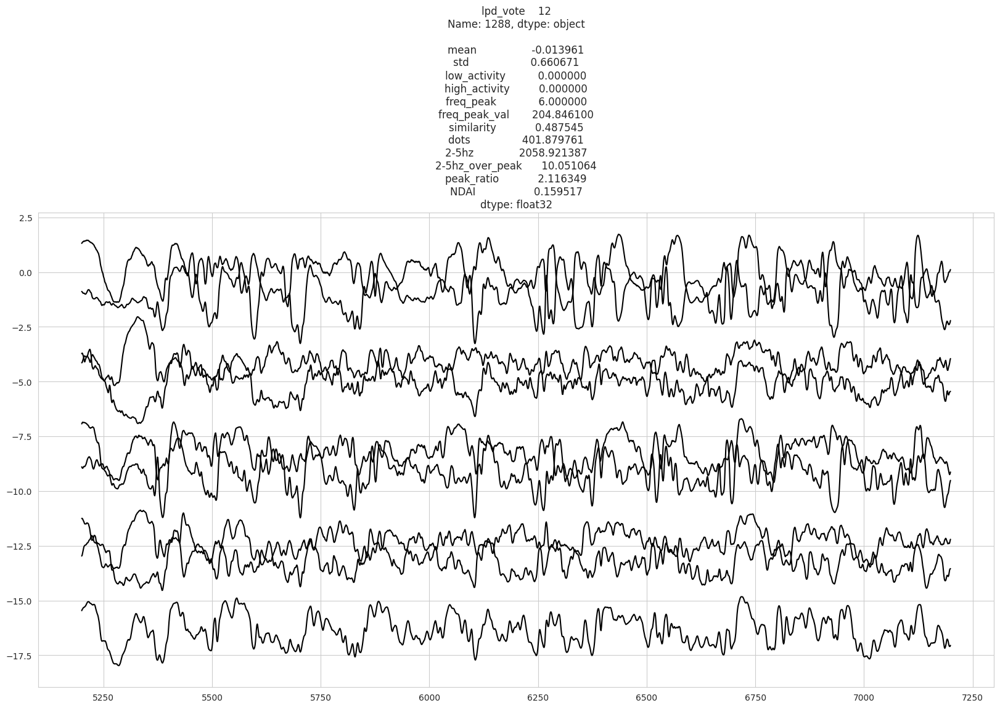

...

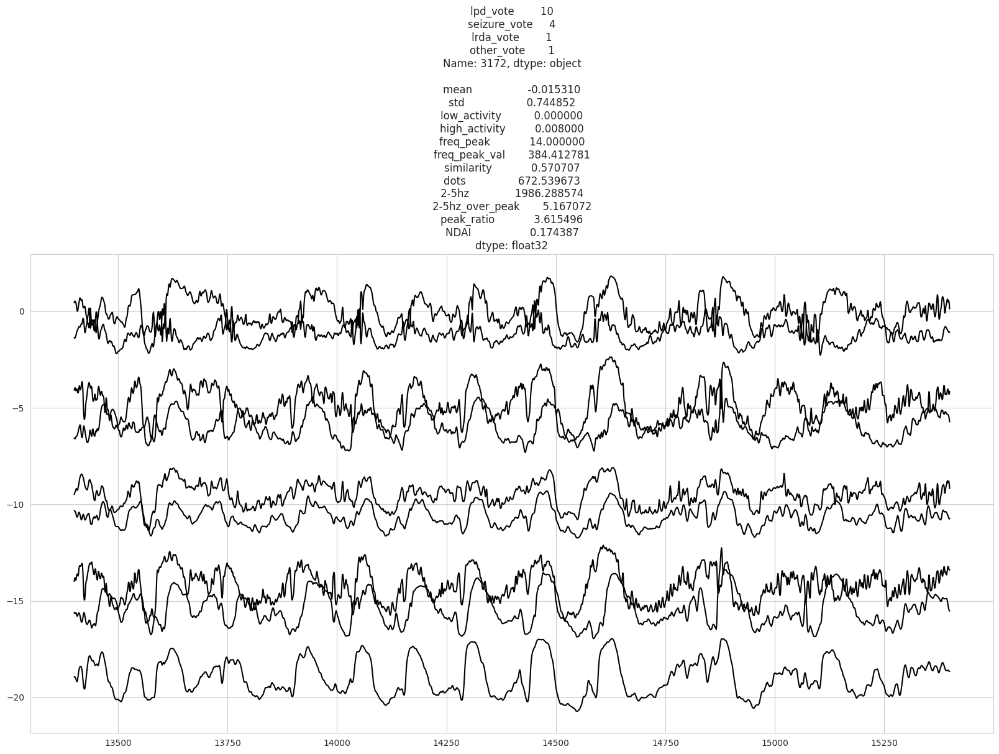

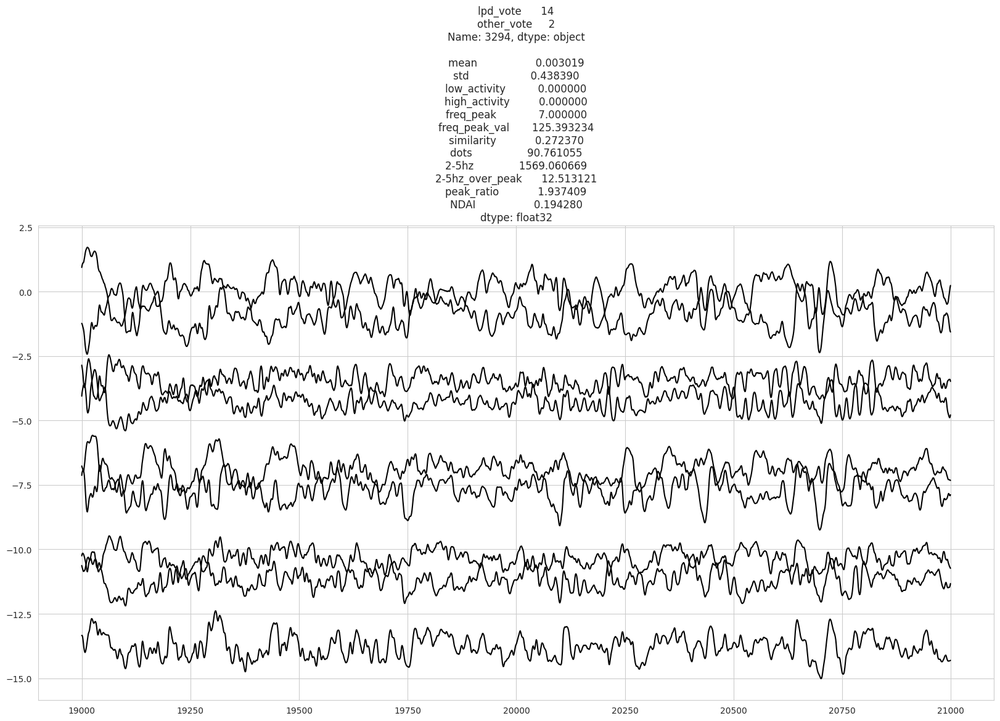

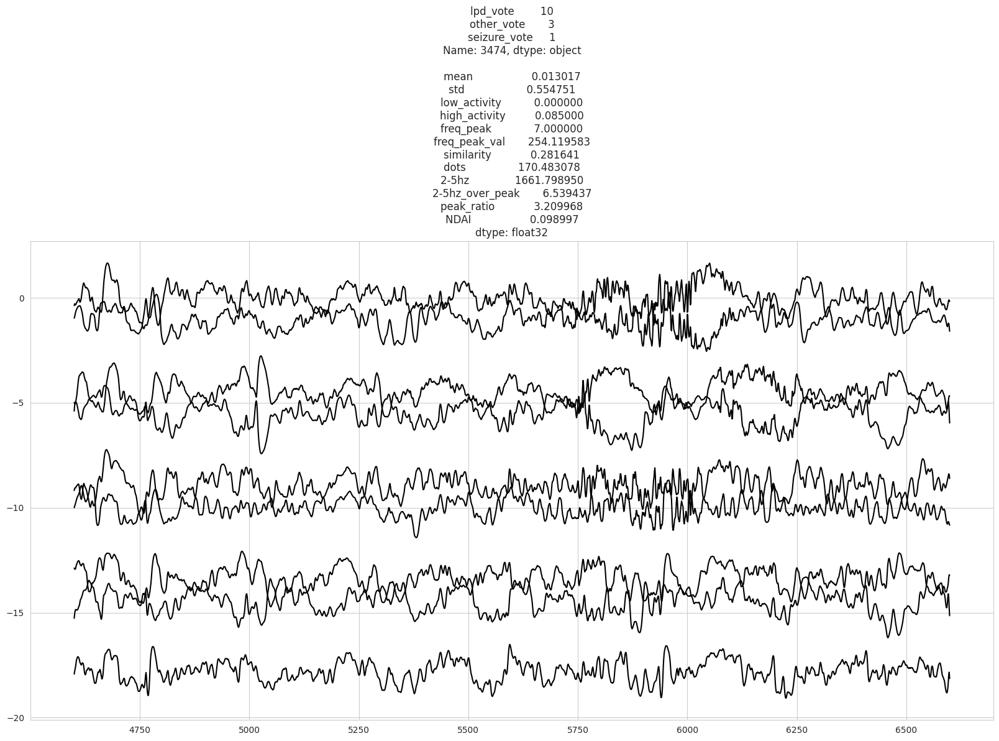

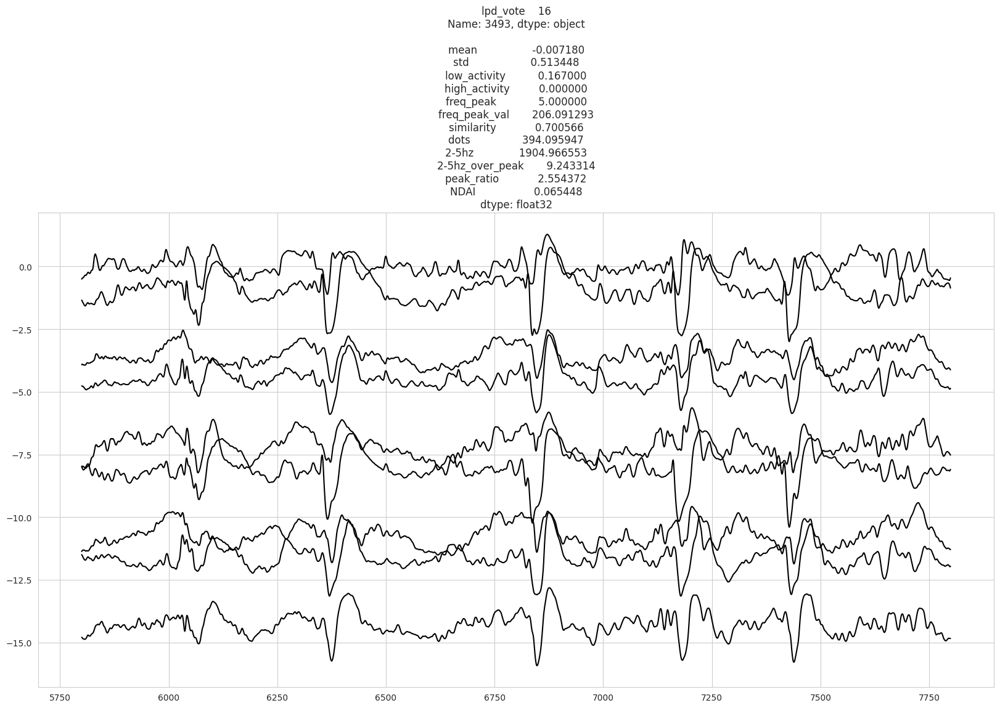

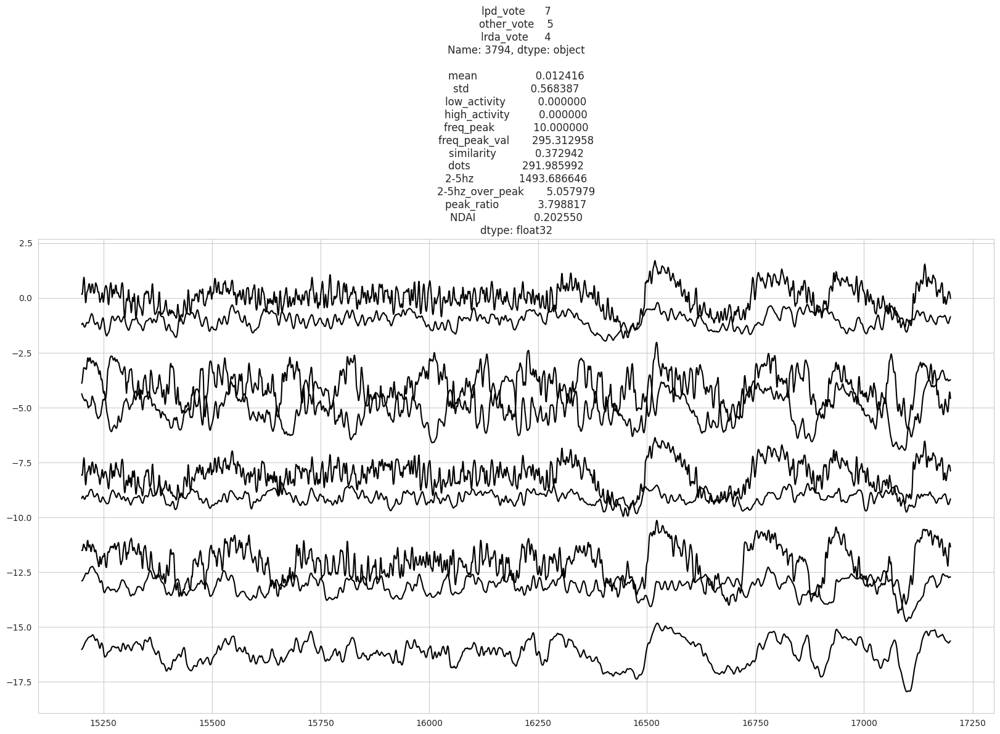

In [19]:
from src.utils.plot_eeg import plot_eeg, to_bipolar, plot_bipolar_eeg, format_y

def display_eeg(i: int):
    row = metadata.iloc[i]
    eeg_id = row['eeg_id']
    votes = row[[col for col in metadata.columns if 'vote' in col]]
    eeg = eegs_processed[eeg_id].iloc[4000:6000]
    try:
        feats = generate_features(eeg, plot=False)
        plot_bipolar_eeg(eeg, title=f'{votes[votes!=0].sort_values(ascending=False)}\n\n{feats}')
    except:
        plt.show()

n_max = 20
i = 0
found = 0
while found < n_max and i < len(metadata):
    if metadata.iloc[i][['lpd_vote']].sum() > 5:
        display_eeg(i)
        found += 1
    i += 1